<a href="https://colab.research.google.com/github/thcucu99/movie-poster-manifold/blob/main/9S912_theo_cucu.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Pre-Trained Model

In [2]:
# Import necessary libraries
import torch
import torchvision.transforms as transforms
from torchvision.models import resnet50
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import numpy as np

# Ensure GPU usage
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [3]:
# Load the pre-trained model
model = resnet50(pretrained=True).to(device)
model = torch.nn.Sequential(*(list(model.children())[:-1]))  # Remove the classification head
model.eval()  # Set the model to evaluation mode


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 193MB/s]


Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)


In [4]:

# Data preprocessing
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to match the model's expected input size
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize with ImageNet stats
])

Load the Data

In [5]:
!rm -r ./movie_posters/.ipynb_checkpoints/


In [6]:
# Load your dataset
# Assuming you've uploaded your dataset to a folder named "movie_posters" in Colab
dataset = ImageFolder(root='./movie_posters', transform=transform)
dataloader = DataLoader(dataset, batch_size=32, shuffle=False)

Extract Features

In [7]:


# Extract features
feature_list = []

with torch.no_grad():
    for inputs, _ in dataloader:
        inputs = inputs.to(device)
        features = model(inputs)
        features = features.squeeze(-1).squeeze(-1).cpu().numpy()  # Convert features to numpy array after removing spatial dimensions
        feature_list.append(features)

features = np.vstack(feature_list)

# At this point, 'features' contains the high-dimensional feature vectors for all posters.
# You can proceed with the dimensionality reduction and visualization steps discussed earlier.


In [8]:
features

array([[0.16267557, 2.2133722 , 0.10993446, ..., 0.15641433, 0.05539027,
        0.08566086],
       [0.2720662 , 2.1516023 , 0.37820563, ..., 0.07742125, 0.4868159 ,
        0.26634318],
       [0.28077388, 1.6774751 , 0.22492273, ..., 0.20045345, 0.12037004,
        0.42096213],
       ...,
       [0.13390204, 1.2857157 , 0.19551188, ..., 0.06331066, 0.12489395,
        0.20189674],
       [0.0283556 , 0.2239221 , 0.11782327, ..., 0.04224518, 0.0113991 ,
        0.0249714 ],
       [0.25726476, 3.0272877 , 0.10885035, ..., 0.34691986, 0.21521918,
        0.02156823]], dtype=float32)

In [9]:
!pip install umap-learn


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.8/90.8 kB 3.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 11.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for umap-learn: filename=umap_learn-0.5.4-py3-none-any.whl size=86770 sha256=5da323900ff186131fc578f6be15b730be0ff6f5ffaa7373739b19e468740418
  Stored in directory: /root/.cache/pip/wheels/fb/66/29/199acf5784d0f7b8add6d466175ab45506c96e386ed5dd0633
  Created wheel for pynndescent: filename=pynndescent-0.5.10-py3-none-any.whl size=55615 sha256=608ab4182139ff97753524f79e119a4181c713e61d9017675076e1c55c8096f6
  Stored in directory: /root/.cache/pip/wheels/4a/38/5d/f60a40a66a9512b7e5e83517ebc2d1b42d857be97d135f1096
Successfully built umap-learn pynndescent


In [10]:
import umap

reducer = umap.UMAP()
embedding = reducer.fit_transform(features)

# 'embedding' now contains the 2D representation of your high-dimensional data


<ipython-input-11-a23584f4ea9b>:4: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(embedding[:, 0], embedding[:, 1], s=5, cmap='Spectral')


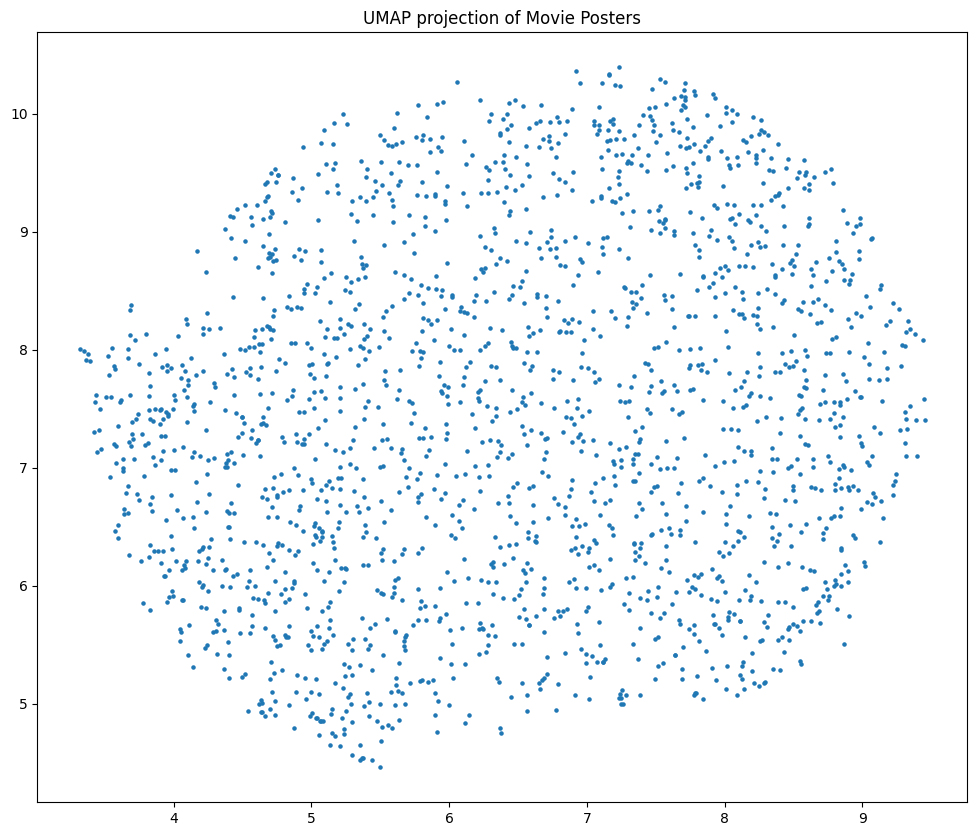

In [11]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 10))
plt.scatter(embedding[:, 0], embedding[:, 1], s=5, cmap='Spectral')
plt.title('UMAP projection of Movie Posters')
plt.show()


In [12]:
!pip install plotly


In [13]:
import plotly.express as px

# Create a DataFrame for the embeddings
import pandas as pd
df = pd.DataFrame(embedding, columns=['x', 'y'])

# Add image URLs/paths to the dataframe
df['image'] = [f"./movie_posters/all_images/{img_name}" for img_name in dataset.samples]

# Create an interactive scatter plot
fig = px.scatter(df, x='x', y='y', hover_data=['image'],
                 title='UMAP projection of Movie Posters with Image Paths')

fig.show()


Genres

In [32]:
import pandas as pd

# Load the TSV
genre_df = pd.read_csv('data.tsv', sep='\t')


# Create a dictionary mapping from ttconst to primary genre
tconst_to_genre = {str(row['tconst']): row['genres'].split(',')[0] if pd.notna(row['genres']) else 'Unknown' for _, row in genre_df.iterrows()}


In [35]:
def get_tconst_from_filename(filename):
  final_digits = filename.split('_')[3].split('.')[0]
  return 'tt'+'0'*(7-len(final_digits))+final_digits
# Extract tconst from your image filenames and map to genre
image_genres = [tconst_to_genre[get_tconst_from_filename(filename)] if get_tconst_from_filename(filename) in tconst_to_genre else 'None' for filename, _ in dataset.samples]

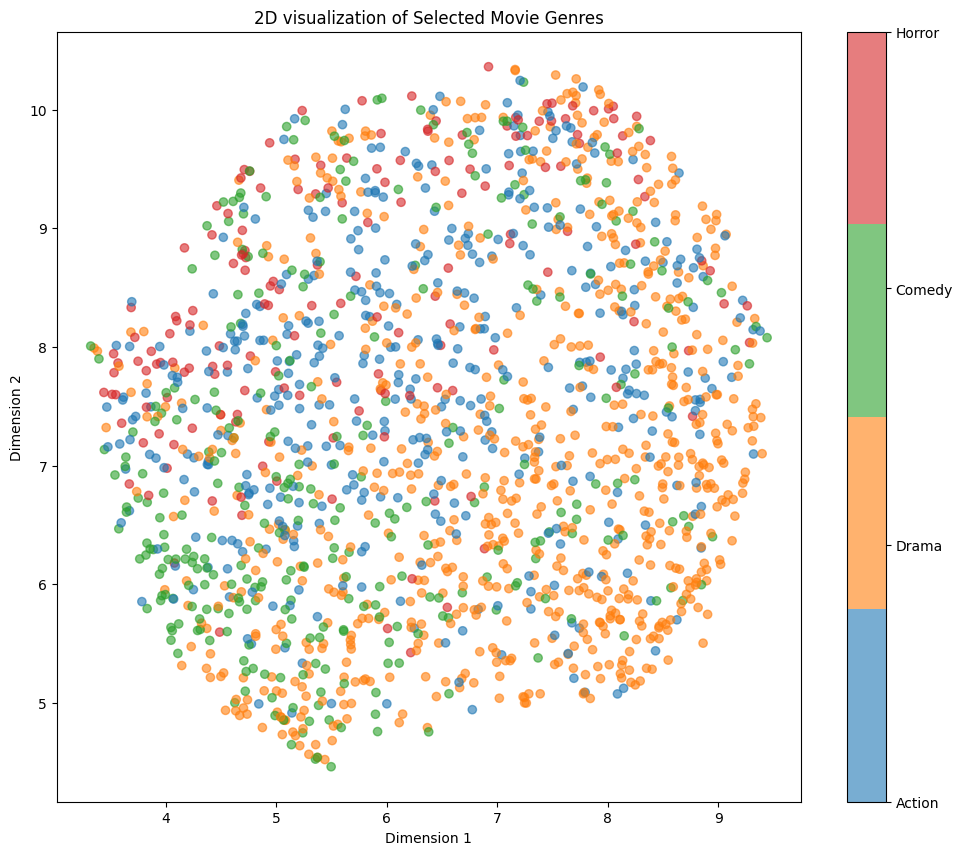

Counter({'Comedy': 747, 'Action': 416, 'Drama': 313, 'Horror': 169})


In [37]:
# Define the genres you are interested in
selected_genres = ['Action', 'Drama', 'Comedy', 'Horror']

# Filter the data based on the selected genres
filtered_indices = [index for index, genre in enumerate(image_genres) if genre in selected_genres]
filtered_embedding = embedding[filtered_indices]
filtered_genres = np.array(image_genres)[filtered_indices]


from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
numeric_labels = label_encoder.fit_transform(filtered_genres)

import matplotlib.colors as mcolors
import numpy as np

# Extract the first 4 colors from 'tab10'
tab10_colors = list(mcolors.TABLEAU_COLORS.values())
custom_colors = tab10_colors[:len(selected_genres)]
custom_cmap = mcolors.ListedColormap(custom_colors)

# Filter out embeddings and labels that are not in the selected genres
selected_indices = [i for i, genre in enumerate(filtered_genres) if genre in selected_genres]
selected_embedding = filtered_embedding[selected_indices]
selected_labels = np.array(filtered_genres)[selected_indices]

numeric_labels = label_encoder.transform(selected_labels)  # Note: using 'transform' not 'fit_transform'

plt.figure(figsize=(12, 10))
scatter = plt.scatter(selected_embedding[:, 0], selected_embedding[:, 1], c=numeric_labels, cmap=custom_cmap, alpha=0.6)

# Show a legend with the unique genres
colorbar = plt.colorbar(scatter, ticks=np.arange(len(selected_genres)))
colorbar.set_ticklabels(selected_genres)

plt.title('2D visualization of Selected Movie Genres')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.show()

from collections import Counter

# Using the selected_labels from the previous code:
genre_counts = Counter(selected_labels)
print(genre_counts)



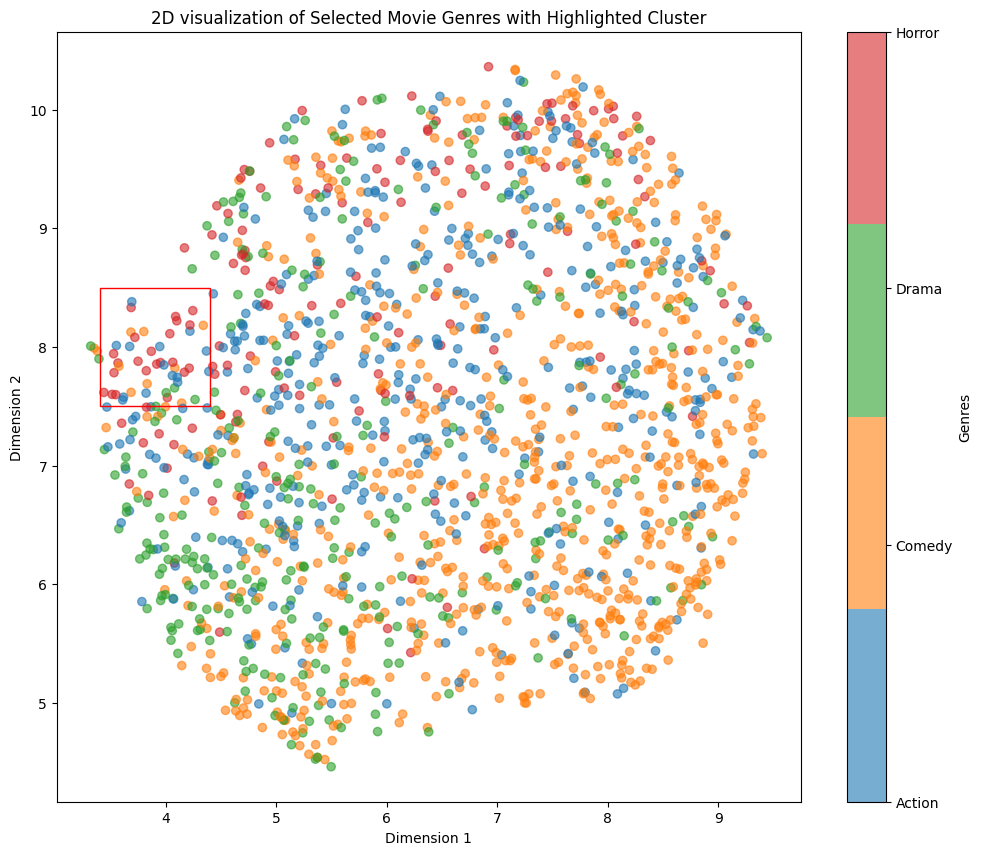

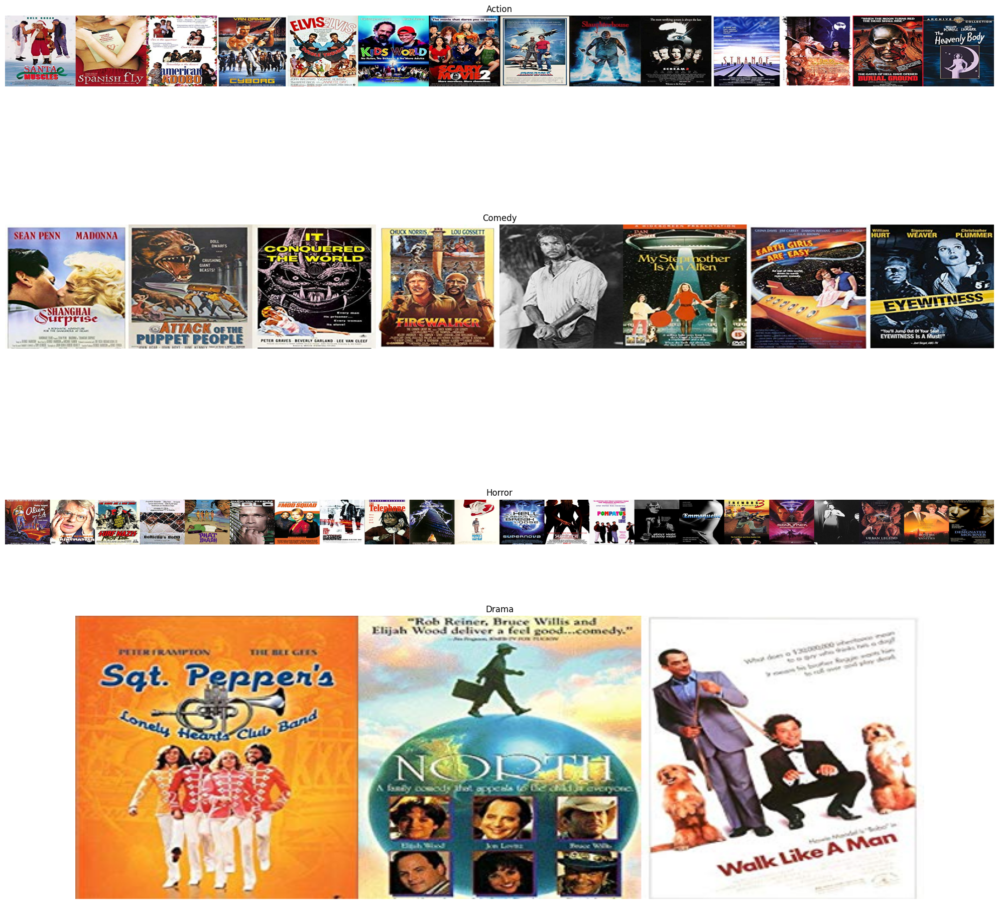

In [40]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
from collections import defaultdict

# Define the cluster range (you can adjust these values)


#mostly comedy, some sci-fi horror, action, drama
x_bounds = [8, 9]
y_bounds = [3.8, 4.3]

x_bounds = [5, 6]
y_bounds = [1.5, 2.5]

#horror!
x_bounds = [3.4, 4.4]
y_bounds = [7.5, 8.5]

# Step 1 & 2: Filter data within the specified range
cluster_indices = np.where((filtered_embedding[:, 0] > x_bounds[0]) &
                           (filtered_embedding[:, 0] < x_bounds[1]) &
                           (filtered_embedding[:, 1] > y_bounds[0]) &
                           (filtered_embedding[:, 1] < y_bounds[1]))[0]

# Step 3: Plot the entire dataset and highlight the region of interest
plt.figure(figsize=(12, 10))
scatter = plt.scatter(filtered_embedding[:, 0], filtered_embedding[:, 1], c=numeric_labels, cmap=custom_cmap, alpha=0.6)
rectangle = patches.Rectangle((x_bounds[0], y_bounds[0]), x_bounds[1]-x_bounds[0], y_bounds[1]-y_bounds[0], edgecolor='red', facecolor='none')
plt.gca().add_patch(rectangle)

# Labels and show
colorbar = plt.colorbar(scatter, ticks=np.arange(len(selected_genres)), label="Genres")
colorbar.set_ticklabels(label_encoder.classes_)
plt.title('2D visualization of Selected Movie Genres with Highlighted Cluster')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.show()

# Step 4: Group movie posters by genre
posters_by_genre = defaultdict(list)

for index in cluster_indices:
    poster_path = dataset.samples[index]
    if isinstance(poster_path, tuple):  # Check if the path is part of a tuple and extract it
        poster_path = poster_path[0]
    movie_genre = selected_labels[index]
    if movie_genre in selected_genres:  # Only consider the genres you selected
        posters_by_genre[movie_genre].append(poster_path)

# Create a composite image of all posters grouped by selected genres
fig, axarr = plt.subplots(nrows=len(posters_by_genre), figsize=(20, 20))

# Display genre-wise collages
for i, (genre, paths) in enumerate(posters_by_genre.items()):
    # We'll create a collage for each genre
    collage_width = len(paths)
    collage_height = 1  # Adjust as needed
    collage = np.zeros((collage_height*224, collage_width*224, 3), dtype=np.uint8)  # Assuming 224x224 posters
    for j, path in enumerate(paths):
        with Image.open(path).convert('RGB') as img:  # Open and ensure RGB format
            collage[0:224, j*224:(j+1)*224, :] = np.array(img.resize((224, 224)))
    axarr[i].imshow(collage)
    axarr[i].set_title(genre)
    axarr[i].axis('off')

plt.tight_layout()
plt.show()



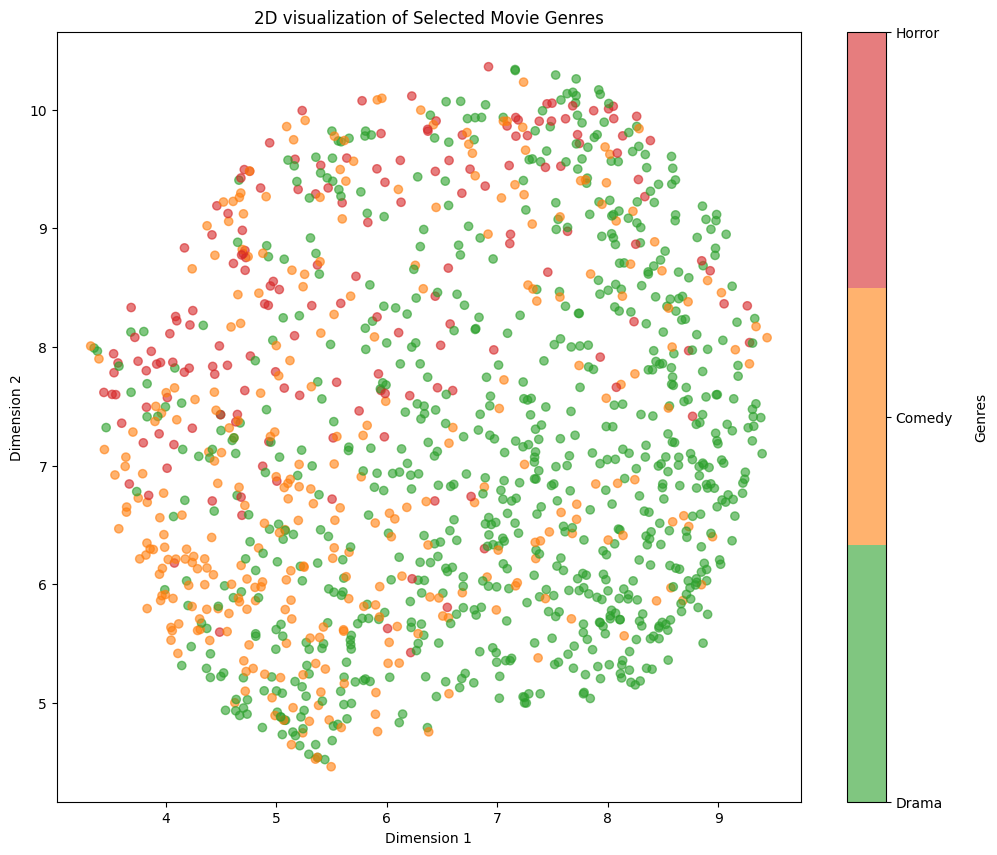

Counter({'Comedy': 747, 'Drama': 313, 'Horror': 169})


In [41]:
# Define the genres you are interested in
selected_genres = ['Drama', 'Comedy', 'Horror']

# Filter the data based on the selected genres
filtered_indices = [index for index, genre in enumerate(image_genres) if genre in selected_genres]
filtered_embedding = embedding[filtered_indices]
filtered_genres = np.array(image_genres)[filtered_indices]

from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
numeric_labels = label_encoder.fit_transform(filtered_genres)

# Set specific colors for the genres
genre_colors = {
    'Drama': '#2ca02c',   # Green from 'tab10'
    'Comedy': '#ff7f0e',  # Orange from 'tab10'
    'Horror': '#d62728'   # Red from 'tab10'
}
custom_colors = [genre_colors[genre] for genre in selected_genres]
custom_cmap = mcolors.ListedColormap(custom_colors)

# Filter out embeddings and labels that are not in the selected genres
selected_indices = [i for i, genre in enumerate(filtered_genres) if genre in selected_genres]
selected_embedding = filtered_embedding[selected_indices]
selected_labels = np.array(filtered_genres)[selected_indices]

numeric_labels = label_encoder.transform(selected_labels)  # Note: using 'transform' not 'fit_transform'

plt.figure(figsize=(12, 10))
scatter = plt.scatter(selected_embedding[:, 0], selected_embedding[:, 1], c=numeric_labels, cmap=custom_cmap, alpha=0.6)

# Show a legend with the unique genres
colorbar = plt.colorbar(scatter, ticks=np.arange(len(selected_genres)))
colorbar.set_ticklabels(selected_genres)
colorbar.ax.set_ylabel("Genres", rotation=90, labelpad=15)  # This line adds "Genres" vertically to the right of the colorbar


plt.title('2D visualization of Selected Movie Genres')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.show()

from collections import Counter

# Using the selected_labels from the previous code:
genre_counts = Counter(selected_labels)
print(genre_counts)


3d

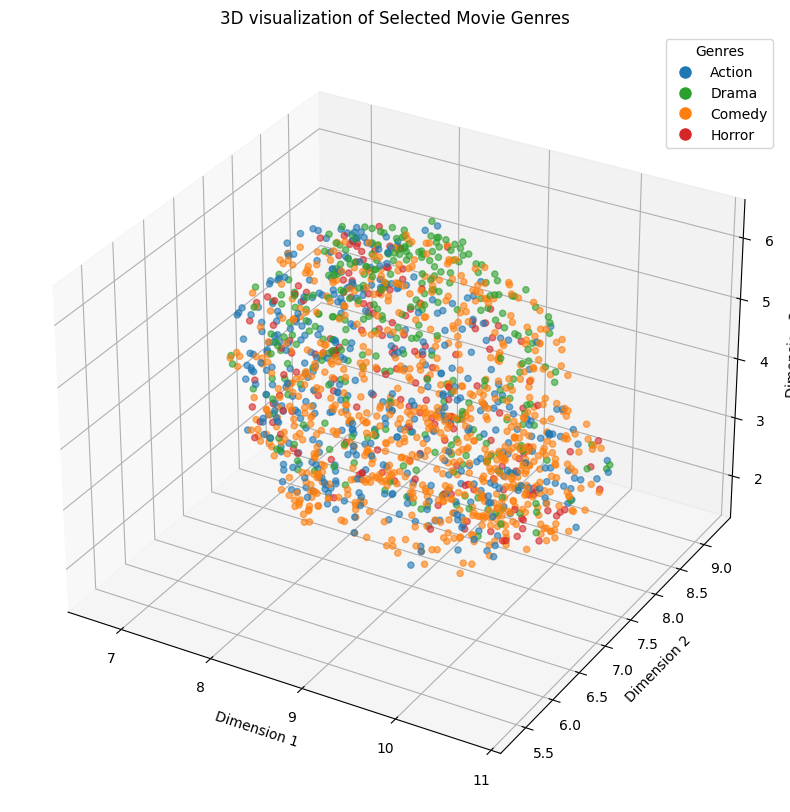

In [42]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Define the genres you are interested in
selected_genres = ['Action', 'Drama', 'Comedy', 'Horror']

# Filter the data based on the selected genres
filtered_indices = [index for index, genre in enumerate(image_genres) if genre in selected_genres]
filtered_embedding_3d = embedding_3d[filtered_indices]  # Assuming you have a variable called embedding_3d
filtered_genres = np.array(image_genres)[filtered_indices]

# Convert genres to numeric labels
label_encoder = LabelEncoder()
numeric_labels = label_encoder.fit_transform(filtered_genres)

# Define custom colors
color_mapping = {
    'Action': '#1f77b4',  # blue
    'Drama': '#2ca02c',   # green
    'Comedy': '#ff7f0e',  # orange
    'Horror': '#d62728'   # red
}
colors = [color_mapping[genre] for genre in filtered_genres]

# Create the 3D plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(filtered_embedding_3d[:, 0],
                    filtered_embedding_3d[:, 1],
                    filtered_embedding_3d[:, 2],
                    c=colors,
                    alpha=0.6)

# Create a custom legend
from matplotlib.lines import Line2D
legend_elements = [Line2D([0], [0], marker='o', color='w', label=genre,
                          markersize=10, markerfacecolor=color_mapping[genre]) for genre in selected_genres]
ax.legend(handles=legend_elements, title="Genres")

ax.set_title('3D visualization of Selected Movie Genres')
ax.set_xlabel('Dimension 1')
ax.set_ylabel('Dimension 2')
ax.set_zlabel('Dimension 3')
plt.show()


Use UMAP

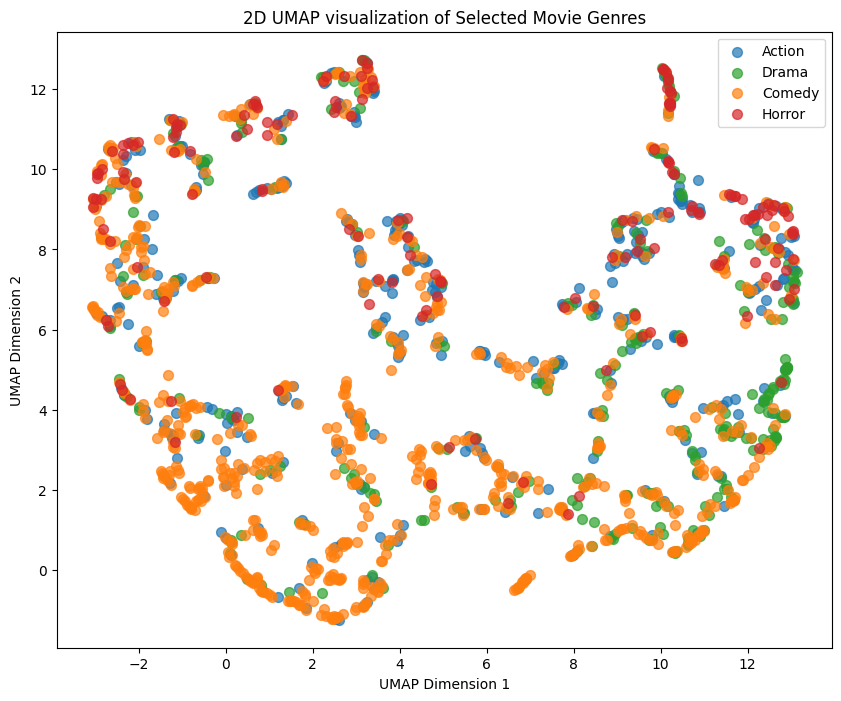

In [61]:
import umap
import numpy as np
import matplotlib.pyplot as plt

# Define the genres you are interested in
selected_genres = ['Action', 'Drama', 'Comedy', 'Horror']

# Filter the data based on the selected genres
filtered_indices = [index for index, genre in enumerate(image_genres) if genre in selected_genres]
filtered_embedding = embedding[filtered_indices]
filtered_genres = np.array(image_genres)[filtered_indices]

# Using UMAP for dimensionality reduction to 2D (you can also reduce to 3D or other dimensions)
reduced_embedding = umap.UMAP(n_neighbors=15, min_dist=0.1, metric='euclidean').fit_transform(filtered_embedding)

# For visualization with colors
colors = {
    'Action': '#1f77b4',  # Blue
    'Drama': '#2ca02c',   # Green
    'Comedy': '#ff7f0e',  # Orange
    'Horror': '#d62728'   # Red
}

plt.figure(figsize=(10, 8))
for genre, color in colors.items():
    indices = [i for i, g in enumerate(filtered_genres) if g == genre]
    plt.scatter(reduced_embedding[indices, 0], reduced_embedding[indices, 1], c=color, label=genre, s=50, alpha=0.7)

plt.title('2D UMAP visualization of Selected Movie Genres')
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.legend()
plt.show()


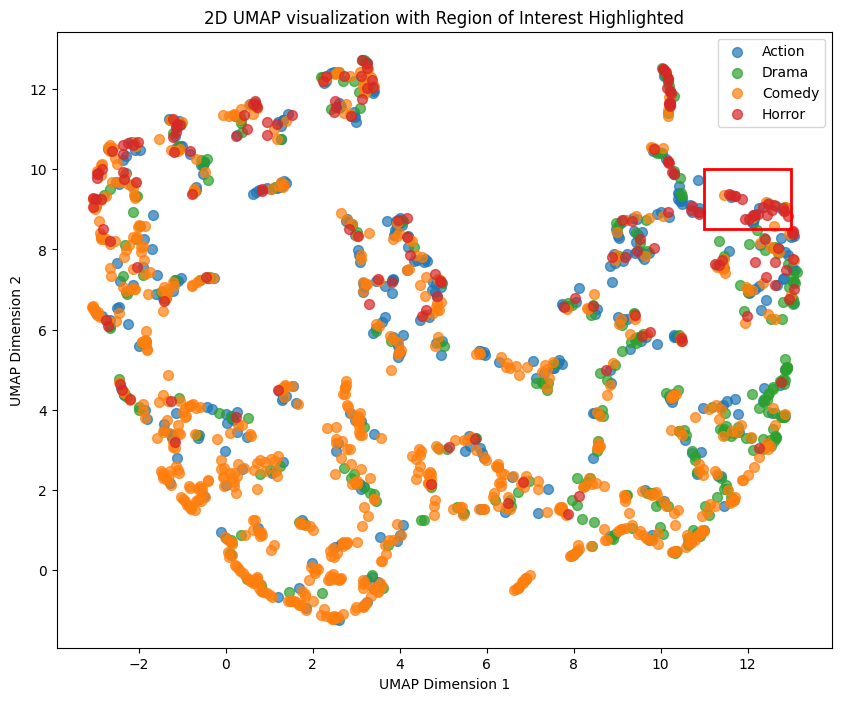

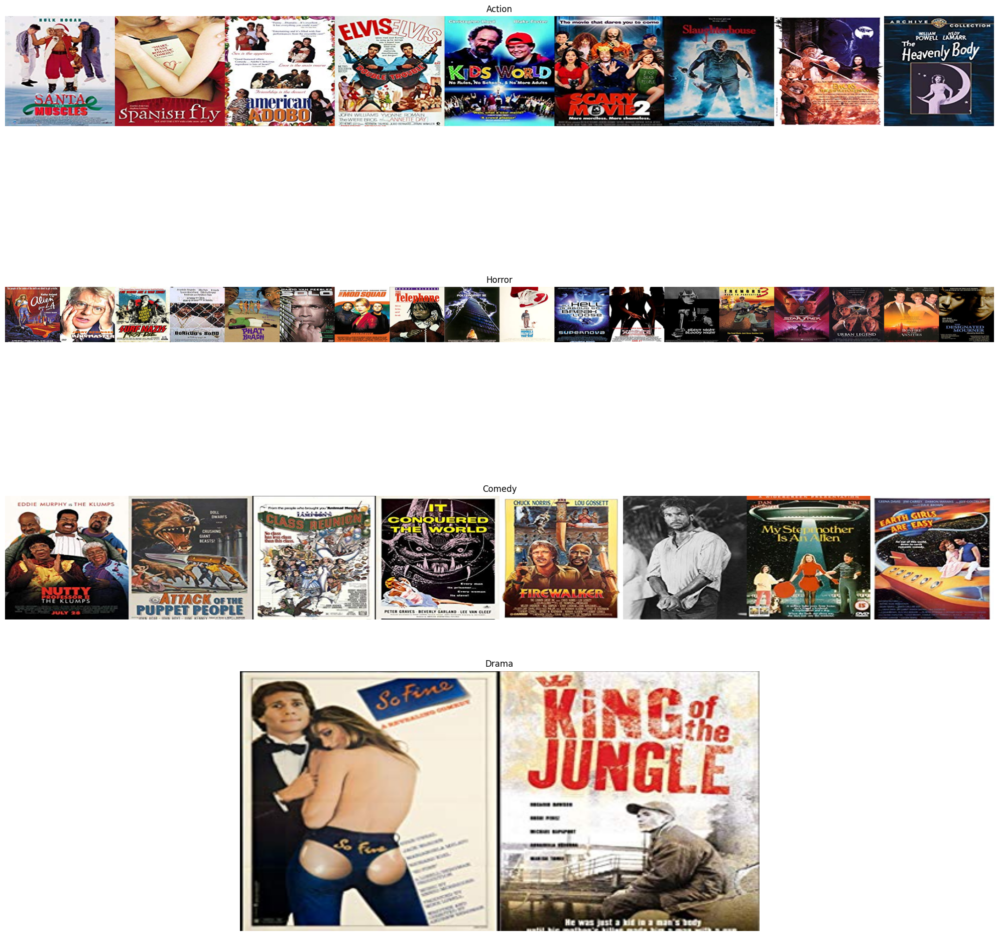

In [69]:
x_min, x_max = 9, 11  # Adjust these values
y_min, y_max = 11, 13  # Adjust these values

x_min, x_max = 11, 13  # Adjust these values
y_min, y_max = 8.5, 10  # Adjust these values

plt.figure(figsize=(10, 8))
for genre, color in colors.items():
    indices = [i for i, g in enumerate(filtered_genres) if g == genre]
    plt.scatter(reduced_embedding[indices, 0], reduced_embedding[indices, 1], c=color, label=genre, s=50, alpha=0.7)

# Highlighting the region with a red box
plt.gca().add_patch(plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, fill=None, edgecolor='red', linewidth=2))
plt.title('2D UMAP visualization with Region of Interest Highlighted')
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.legend()
plt.show()


from collections import defaultdict
from PIL import Image

# Getting indices of movies in the ROI
cluster_indices = [i for i, (x, y) in enumerate(reduced_embedding) if x_min <= x <= x_max and y_min <= y <= y_max]

posters_by_genre = defaultdict(list)

for index in cluster_indices:
    poster_path = dataset.samples[index]
    if isinstance(poster_path, tuple):  # Check if the path is part of a tuple and extract it
        poster_path = poster_path[0]
    movie_genre = filtered_genres[index]
    if movie_genre in selected_genres:  # Only consider the genres you selected
        posters_by_genre[movie_genre].append(poster_path)

# Create a composite image of all posters grouped by selected genres
fig, axarr = plt.subplots(nrows=len(posters_by_genre), figsize=(20, 20))

# Display genre-wise collages
for i, (genre, paths) in enumerate(posters_by_genre.items()):
    # We'll create a collage for each genre
    collage_width = len(paths)
    collage_height = 1  # Adjust as needed
    collage = np.zeros((collage_height*224, collage_width*224, 3), dtype=np.uint8)  # Assuming 224x224 posters
    for j, path in enumerate(paths):
        with Image.open(path).convert('RGB') as img:  # Open and ensure RGB format
            collage[0:224, j*224:(j+1)*224, :] = np.array(img.resize((224, 224)))
    axarr[i].imshow(collage)
    axarr[i].set_title(genre)
    axarr[i].axis('off')

plt.tight_layout()
plt.show()



In [78]:
%matplotlib inline


In 3D

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

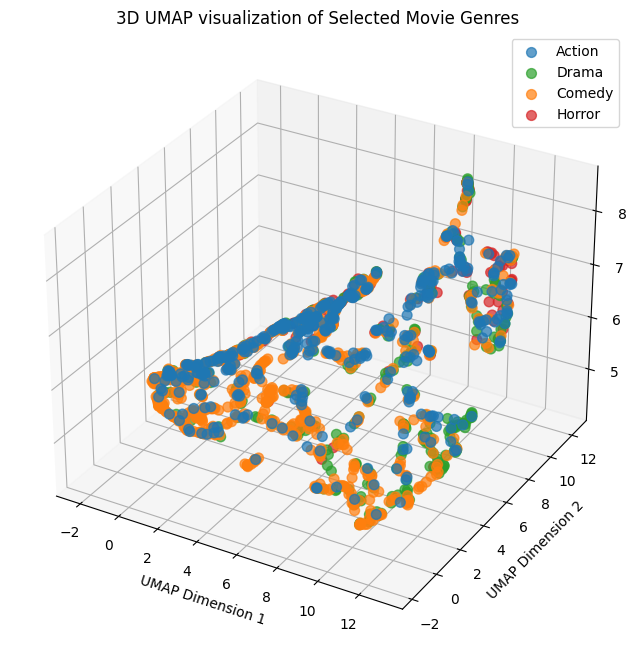

In [79]:
import umap
import numpy as np
import matplotlib.pyplot as plt

# Define the genres you are interested in
selected_genres = ['Action', 'Drama', 'Comedy', 'Horror']

# Filter the data based on the selected genres
filtered_indices = [index for index, genre in enumerate(image_genres) if genre in selected_genres]
filtered_embedding = embedding[filtered_indices]
filtered_genres = np.array(image_genres)[filtered_indices]

# Using UMAP for dimensionality reduction to 3D
reduced_embedding = umap.UMAP(n_neighbors=15, min_dist=0.1, metric='euclidean', n_components=3).fit_transform(filtered_embedding)

# For visualization with colors
colors = {
    'Action': '#1f77b4',  # Blue
    'Drama': '#2ca02c',   # Green
    'Comedy': '#ff7f0e',  # Orange
    'Horror': '#d62728'   # Red
}

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot each genre
for genre, color in colors.items():
    indices = [i for i, g in enumerate(filtered_genres) if g == genre]
    ax.scatter(reduced_embedding[indices, 0], reduced_embedding[indices, 1], reduced_embedding[indices, 2], c=color, label=genre, s=50, alpha=0.7)

ax.set_title('3D UMAP visualization of Selected Movie Genres')
ax.set_xlabel('UMAP Dimension 1')
ax.set_ylabel('UMAP Dimension 2')
ax.set_zlabel('UMAP Dimension 3')
ax.legend()

plt.show()


In [115]:
# Using UMAP for dimensionality reduction to 3D
reduced_embedding_3d = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=3, metric='euclidean').fit_transform(embedding)

# Define the two genres of interest
genres_of_interest = ['Comedy', 'Horror']

# Get indices and data for the two genres
two_genre_indices = [index for index, genre in enumerate(image_genres) if genre in genres_of_interest]
two_genre_embedding = reduced_embedding_3d[two_genre_indices]
two_genre_labels = np.array(image_genres)[two_genre_indices]

import plotly.express as px

# Create a scatter plot for the embeddings
fig = px.scatter_3d(
    two_genre_embedding, x=0, y=1, z=2,
    color=two_genre_labels,
    labels={'0': 'Dimension 1', '1': 'Dimension 2', '2': 'Dimension 3'},
    color_discrete_map={'Comedy': '#ff7f0e', 'Horror': '#d62728'}
)

fig.show()

In [123]:
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

# Convert genre labels to binary format for SVM training: Comedy = 0, Horror = 1
two_genre_labels_binary = np.array([0 if genre == 'Comedy' else 1 for genre in two_genre_labels])

# Split the data into training and test sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(two_genre_embedding, two_genre_labels_binary, test_size=0.2, random_state=42)

# Initialize SVM with RBF kernel
clf = SVC(kernel='rbf', C=1, gamma='scale')
clf.fit(X_train, y_train)

# Predict on test data
y_pred = clf.predict(X_test)

# Evaluate the SVM
print("Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred, target_names=['Comedy', 'Horror']))


Accuracy: 0.8478260869565217
              precision    recall  f1-score   support

      Comedy       0.85      0.98      0.91       149
      Horror       0.77      0.29      0.42        35

    accuracy                           0.85       184
   macro avg       0.81      0.63      0.66       184
weighted avg       0.84      0.85      0.82       184



In [124]:
import numpy as np
import plotly.graph_objects as go

# Create a meshgrid in the 3D space
x_range = np.linspace(two_genre_embedding[:, 0].min(), two_genre_embedding[:, 0].max(), 20)
y_range = np.linspace(two_genre_embedding[:, 1].min(), two_genre_embedding[:, 1].max(), 20)
z_range = np.linspace(two_genre_embedding[:, 2].min(), two_genre_embedding[:, 2].max(), 20)

xx, yy, zz = np.meshgrid(x_range, y_range, z_range, indexing="ij")
grid_points = np.c_[xx.ravel(), yy.ravel(), zz.ravel()]

# Predict the labels using SVM
predictions = clf.predict(grid_points)

# Use a different color for each predicted class
colors = ['#ff7f0e' if label == 0 else '#d62728' for label in predictions]

# Scatter plot for the embeddings
scatter = go.Scatter3d(
    x=two_genre_embedding[:, 0],
    y=two_genre_embedding[:, 1],
    z=two_genre_embedding[:, 2],
    mode='markers',
    marker=dict(color=['#ff7f0e' if label == 'Comedy' else '#d62728' for label in two_genre_labels], size=5)
)

# Decision boundary approximated using grid points
boundary = go.Scatter3d(
    x=grid_points[:, 0],
    y=grid_points[:, 1],
    z=grid_points[:, 2],
    mode='markers',
    marker=dict(color=colors, size=2, opacity=0.5)
)

layout = go.Layout(scene=dict(xaxis_title="Dimension 1", yaxis_title="Dimension 2", zaxis_title="Dimension 3"),
                   margin=dict(l=0, r=0, b=0, t=0))

fig = go.Figure(data=[scatter, boundary], layout=layout)

fig.show()
